In [9]:
# ================================================
# Neural Network Neuron Activation Analysis Suite
# Using Fashion-MNIST with Overfitting Assessment
# ================================================

# Import Necessary Libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import os
import seaborn as sns

# Enable inline plotting for Jupyter
%matplotlib inline

# ==================================================
# Configuration Parameters
# ==================================================
CONFIG = {
    'depth': 5,                  # Number of hidden layers
    'width': 128,                # Number of neurons per hidden layer
    'epochs': 30,                # Number of training epochs
    'batch_size': 256,            # Batch size for training and evaluation
    'learning_rate': 0.01,       # Learning rate for optimizer
    'output_dir': 'activation_plots',  # Directory to save activation plots
    'device': torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Device configuration
}

print("Configuration Parameters:")
for key, value in CONFIG.items():
    print(f"  {key}: {value}")
print("\n")

# ==================================================
# Define the CustomNet
# ==================================================
class CustomNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(CustomNet, self).__init__()
        layers = []
        self.num_layers = num_layers
        self.hidden_size = hidden_size

        # Input layer
        layers.append(nn.Linear(input_size, hidden_size))
        layers.append(nn.ReLU())

        # Hidden layers
        for _ in range(num_layers - 1):
            layers.append(nn.Linear(hidden_size, hidden_size))
            layers.append(nn.ReLU())

        # Output layer
        layers.append(nn.Linear(hidden_size, num_classes))

        self.network = nn.Sequential(*layers)

    def forward(self, x):
        return self.network(x)

# ==================================================
# Activation Capturing with Hooks
# ==================================================
def get_activation_hooks(model, activations):
    hooks = []
    for name, layer in model.named_modules():
        if isinstance(layer, nn.Linear):
            def hook_fn(module, input, output, layer_name=name):
                # Detach and move to CPU to prevent memory leaks
                activations[layer_name].append(output.detach().cpu())
            hooks.append(layer.register_forward_hook(hook_fn))
    return hooks

# ==================================================
# Compute Statistics from Activations
# ==================================================
def compute_statistics(activations, dataset_size):
    stats = {}
    for layer, act_list in activations.items():
        # Concatenate all batches
        act = torch.cat(act_list, dim=0)  # Shape: [dataset_size, num_neurons]
        # Compute statistics
        mean = torch.mean(act, dim=0).numpy()
        var = torch.var(act, dim=0).numpy()
        min_val = torch.min(act, dim=0).values.numpy()
        max_val = torch.max(act, dim=0).values.numpy()
        stats[layer] = {
            'mean': mean,
            'variance': var,
            'min': min_val,
            'max': max_val
        }
    return stats

# ==================================================
# Visualization Functions
# ==================================================
def plot_epoch_statistics(stats, epoch, dataset_type, output_dir):
    layers = stats.keys()
    for layer in layers:
        num_neurons = len(stats[layer]['mean'])
        neurons = range(num_neurons)
        plt.figure(figsize=(12, 10))

        # Mean Activation
        plt.subplot(2, 2, 1)
        plt.scatter(neurons, stats[layer]['mean'], s=10, alpha=0.6)
        plt.title(f'{layer} - Mean Activation ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Mean Activation')

        # Variance of Activation
        plt.subplot(2, 2, 2)
        plt.scatter(neurons, stats[layer]['variance'], s=10, alpha=0.6, color='orange')
        plt.title(f'{layer} - Variance of Activation ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Variance')

        # Min Activation
        plt.subplot(2, 2, 3)
        plt.scatter(neurons, stats[layer]['min'], s=10, alpha=0.6, color='green')
        plt.title(f'{layer} - Min Activation ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Min Activation')

        # Max Activation
        plt.subplot(2, 2, 4)
        plt.scatter(neurons, stats[layer]['max'], s=10, alpha=0.6, color='red')
        plt.title(f'{layer} - Max Activation ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Max Activation')

        plt.tight_layout()
        # Create subdirectory for dataset type if not exists
        dataset_dir = os.path.join(output_dir, dataset_type)
        if not os.path.exists(dataset_dir):
            os.makedirs(dataset_dir)
        epoch_plot_path = os.path.join(dataset_dir, f'{layer}_epoch_{epoch+1}.png')
        plt.savefig(epoch_plot_path)
        plt.close()
        print(f'  Saved epoch statistics plot for {layer} on {dataset_type} set at {epoch_plot_path}')

def plot_cumulative_statistics(all_stats_train, all_stats_test, num_epochs, output_dir):
    layers = all_stats_train[0].keys()
    for layer in layers:
        num_neurons = len(all_stats_train[0][layer]['mean'])
        neurons = range(num_neurons)

        # For cumulative visualization, plot trends for a subset of neurons to avoid clutter
        subset = np.linspace(0, num_neurons - 1, min(10, num_neurons)).astype(int)

        # Plot for Mean Activation
        plt.figure(figsize=(14, 6))

        # Mean Activation Over Epochs - Training Set
        plt.subplot(2, 2, 1)
        for neuron in subset:
            means = [epoch_stat[layer]['mean'][neuron] for epoch_stat in all_stats_train]
            plt.plot(range(1, num_epochs + 1), means, label=f'Neuron {neuron}')
        plt.title(f'{layer} - Mean Activation Over Epochs (Train)')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Activation')
        plt.legend(loc='upper right', fontsize='small')

        # Mean Activation Over Epochs - Test Set
        plt.subplot(2, 2, 2)
        for neuron in subset:
            means = [epoch_stat[layer]['mean'][neuron] for epoch_stat in all_stats_test]
            plt.plot(range(1, num_epochs + 1), means, label=f'Neuron {neuron}')
        plt.title(f'{layer} - Mean Activation Over Epochs (Test)')
        plt.xlabel('Epoch')
        plt.ylabel('Mean Activation')
        plt.legend(loc='upper right', fontsize='small')

        # Variance of Activation Over Epochs - Training Set
        plt.subplot(2, 2, 3)
        for neuron in subset:
            variances = [epoch_stat[layer]['variance'][neuron] for epoch_stat in all_stats_train]
            plt.plot(range(1, num_epochs + 1), variances, label=f'Neuron {neuron}')
        plt.title(f'{layer} - Variance of Activation Over Epochs (Train)')
        plt.xlabel('Epoch')
        plt.ylabel('Variance of Activation')
        plt.legend(loc='upper right', fontsize='small')

        # Variance of Activation Over Epochs - Test Set
        plt.subplot(2, 2, 4)
        for neuron in subset:
            variances = [epoch_stat[layer]['variance'][neuron] for epoch_stat in all_stats_test]
            plt.plot(range(1, num_epochs + 1), variances, label=f'Neuron {neuron}')
        plt.title(f'{layer} - Variance of Activation Over Epochs (Test)')
        plt.xlabel('Epoch')
        plt.ylabel('Variance of Activation')
        plt.legend(loc='upper right', fontsize='small')

        plt.tight_layout()
        # Create subdirectory for cumulative plots if not exists
        cumulative_dir = os.path.join(output_dir, 'cumulative_plots')
        if not os.path.exists(cumulative_dir):
            os.makedirs(cumulative_dir)
        cumulative_plot_path = os.path.join(cumulative_dir, f'{layer}_cumulative.png')
        plt.savefig(cumulative_plot_path)
        plt.close()
        print(f'  Saved cumulative plot for {layer} at {cumulative_plot_path}')

        # Heatmaps for Mean and Variance - Training Set
        # Mean Heatmap - Training Set
        mean_matrix_train = np.array([epoch_stat[layer]['mean'] for epoch_stat in all_stats_train])
        plt.figure(figsize=(12, 6))
        sns.heatmap(mean_matrix_train.T, cmap='viridis')
        plt.title(f'{layer} - Mean Activation Heatmap Over Epochs (Train)')
        plt.xlabel('Epoch')
        plt.ylabel('Neuron')
        heatmap_train_path = os.path.join(cumulative_dir, f'{layer}_mean_heatmap_train.png')
        plt.savefig(heatmap_train_path)
        plt.close()
        print(f'  Saved mean activation heatmap for {layer} on Train set at {heatmap_train_path}')

        # Variance Heatmap - Training Set
        var_matrix_train = np.array([epoch_stat[layer]['variance'] for epoch_stat in all_stats_train])
        plt.figure(figsize=(12, 6))
        sns.heatmap(var_matrix_train.T, cmap='magma')
        plt.title(f'{layer} - Variance of Activation Heatmap Over Epochs (Train)')
        plt.xlabel('Epoch')
        plt.ylabel('Neuron')
        var_heatmap_train_path = os.path.join(cumulative_dir, f'{layer}_variance_heatmap_train.png')
        plt.savefig(var_heatmap_train_path)
        plt.close()
        print(f'  Saved variance activation heatmap for {layer} on Train set at {var_heatmap_train_path}')

        # Heatmaps for Mean and Variance - Test Set
        # Mean Heatmap - Test Set
        mean_matrix_test = np.array([epoch_stat[layer]['mean'] for epoch_stat in all_stats_test])
        plt.figure(figsize=(12, 6))
        sns.heatmap(mean_matrix_test.T, cmap='viridis')
        plt.title(f'{layer} - Mean Activation Heatmap Over Epochs (Test)')
        plt.xlabel('Epoch')
        plt.ylabel('Neuron')
        heatmap_test_path = os.path.join(cumulative_dir, f'{layer}_mean_heatmap_test.png')
        plt.savefig(heatmap_test_path)
        plt.close()
        print(f'  Saved mean activation heatmap for {layer} on Test set at {heatmap_test_path}')

        # Variance Heatmap - Test Set
        var_matrix_test = np.array([epoch_stat[layer]['variance'] for epoch_stat in all_stats_test])
        plt.figure(figsize=(12, 6))
        sns.heatmap(var_matrix_test.T, cmap='magma')
        plt.title(f'{layer} - Variance of Activation Heatmap Over Epochs (Test)')
        plt.xlabel('Epoch')
        plt.ylabel('Neuron')
        var_heatmap_test_path = os.path.join(cumulative_dir, f'{layer}_variance_heatmap_test.png')
        plt.savefig(var_heatmap_test_path)
        plt.close()
        print(f'  Saved variance activation heatmap for {layer} on Test set at {var_heatmap_test_path}')

# ==================================================
# Prepare the Fashion-MNIST Dataset and DataLoaders
# ==================================================
print("Preparing the Fashion-MNIST dataset...")

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalizing to mean=0.5, std=0.5 for Fashion-MNIST
])

# Download and load training data
full_train_dataset = datasets.FashionMNIST(root='data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST(root='data', train=False, transform=transform)

# Split the full_train_dataset into 90% train and 10% test
train_size = int(0.9 * len(full_train_dataset))
test_size = len(full_train_dataset) - train_size
train_dataset, validation_dataset = random_split(full_train_dataset, [train_size, test_size])

print(f"Total training samples: {len(train_dataset)}")
print(f"Validation (held-out test) samples: {len(validation_dataset)}\n")

# Create DataLoaders
train_loader = DataLoader(dataset=train_dataset, batch_size=CONFIG['batch_size'], shuffle=True)
validation_loader = DataLoader(dataset=validation_dataset, batch_size=CONFIG['batch_size'], shuffle=False)

print("Dataset preparation completed.\n")

# ==================================================
# Initialize the Model, Loss Function, and Optimizer
# ==================================================
input_size = 28 * 28
hidden_size = CONFIG['width']
num_layers = CONFIG['depth']
num_classes = 10

model = CustomNet(input_size, hidden_size, num_layers, num_classes).to(CONFIG['device'])

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=CONFIG['learning_rate'])

print(f"Initialized CustomNet with {num_layers} hidden layers and {hidden_size} neurons per layer.")
print(f"Using device: {CONFIG['device']}\n")

# ==================================================
# Create Output Directory for Plots
# ==================================================
output_dir = CONFIG['output_dir']
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f'Created output directory at "{output_dir}".\n')
else:
    print(f'Output directory "{output_dir}" already exists.\n')

# ==================================================
# Training Loop with Activation Capture and Statistics Computation
# ==================================================
# To store statistics across all epochs for both train and test sets
all_statistics_train = []
all_statistics_test = []

print("Starting training...\n")

for epoch in range(CONFIG['epochs']):
    print(f"Epoch {epoch+1}/{CONFIG['epochs']}")
    model.train()
    running_loss = 0.0
    total_batches = len(train_loader)
    
    for batch_idx, (images, labels) in enumerate(train_loader):
        # Move tensors to configured device
        images = images.view(-1, 28*28).to(CONFIG['device'])
        labels = labels.to(CONFIG['device'])
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        if (batch_idx + 1) % 100 == 0 or (batch_idx + 1) == total_batches:
            print(f'  Batch [{batch_idx+1}/{total_batches}], Loss: {loss.item():.4f}')
    
    avg_loss = running_loss / total_batches
    print(f"  Average Loss: {avg_loss:.4f}")
    
    # Activation Capture Phase for Training Set
    print(f"  Capturing activations for Training Set after Epoch {epoch+1}...")
    model.eval()
    with torch.no_grad():
        # Dictionary to store activations per layer
        activations_train = defaultdict(list)
        
        # Register hooks
        hooks_train = get_activation_hooks(model, activations_train)
        
        # Perform forward pass on the training dataset
        for images, labels in train_loader:
            images = images.view(-1, 28*28).to(CONFIG['device'])
            outputs = model(images)
        
        # Remove hooks
        for hook in hooks_train:
            hook.remove()
        
        # Compute statistics
        stats_train = compute_statistics(activations_train, len(train_dataset))
        all_statistics_train.append(stats_train)
        
        # Plot statistics for the current epoch (Training Set)
        plot_epoch_statistics(stats_train, epoch, 'train', output_dir)
    
    # Activation Capture Phase for Test Set
    print(f"  Capturing activations for Test Set after Epoch {epoch+1}...")
    with torch.no_grad():
        # Dictionary to store activations per layer
        activations_test = defaultdict(list)
        
        # Register hooks
        hooks_test = get_activation_hooks(model, activations_test)
        
        # Perform forward pass on the test dataset
        for images, labels in validation_loader:
            images = images.view(-1, 28*28).to(CONFIG['device'])
            outputs = model(images)
        
        # Remove hooks
        for hook in hooks_test:
            hook.remove()
        
        # Compute statistics
        stats_test = compute_statistics(activations_test, len(validation_dataset))
        all_statistics_test.append(stats_test)
        
        # Plot statistics for the current epoch (Test Set)
        plot_epoch_statistics(stats_test, epoch, 'test', output_dir)
    
    print(f"  Completed Epoch {epoch+1}/{CONFIG['epochs']}\n")

print("Training completed.\n")

# ==================================================
# Generate Cumulative Visualizations After Training
# ==================================================
print("Generating cumulative statistics plots...")
plot_cumulative_statistics(all_statistics_train, all_statistics_test, CONFIG['epochs'], output_dir)
print("Cumulative statistics plots generated.\n")

print(f'All activation statistics plots are saved in the "{output_dir}" directory.')


Configuration Parameters:
  depth: 5
  width: 128
  epochs: 30
  batch_size: 256
  learning_rate: 0.01
  output_dir: activation_plots
  device: cuda


Preparing the Fashion-MNIST dataset...
Total training samples: 54000
Validation (held-out test) samples: 6000

Dataset preparation completed.

Initialized CustomNet with 5 hidden layers and 128 neurons per layer.
Using device: cuda

Output directory "activation_plots" already exists.

Starting training...

Epoch 1/30
  Batch [100/211], Loss: 2.3036
  Batch [200/211], Loss: 2.3036
  Batch [211/211], Loss: 2.3039
  Average Loss: 2.3028
  Capturing activations for Training Set after Epoch 1...
  Saved epoch statistics plot for network.0 on train set at activation_plots/train/network.0_epoch_1.png
  Saved epoch statistics plot for network.2 on train set at activation_plots/train/network.2_epoch_1.png
  Saved epoch statistics plot for network.4 on train set at activation_plots/train/network.4_epoch_1.png
  Saved epoch statistics plot for netw

Displaying combined plots for Training Set over 10 epochs:


/tmp/ipykernel_1679/3633679552.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = [cm.get_cmap('tab10')(i / num_layers) for i in range(num_layers)]


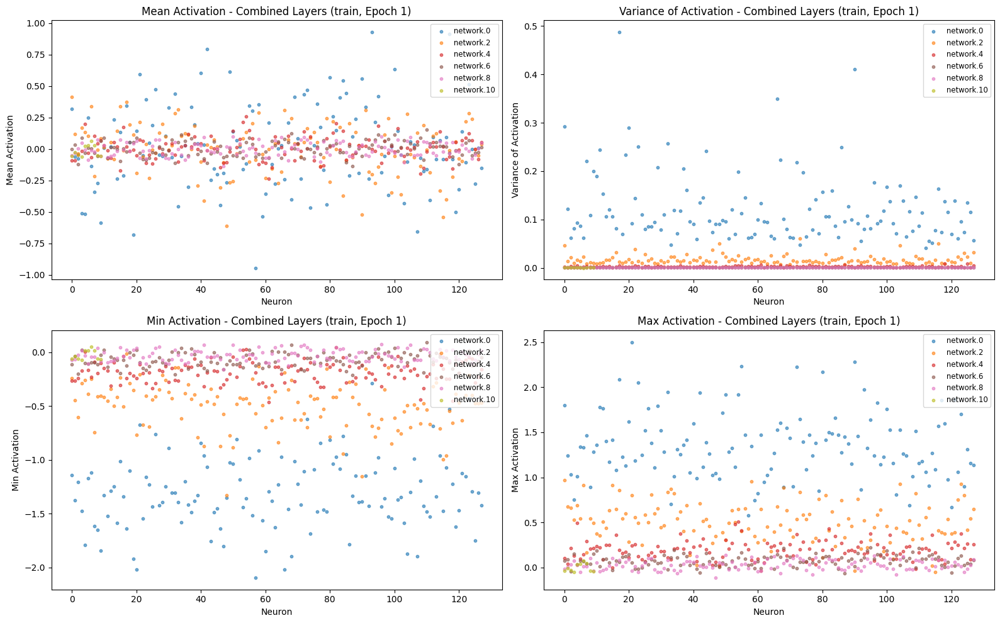

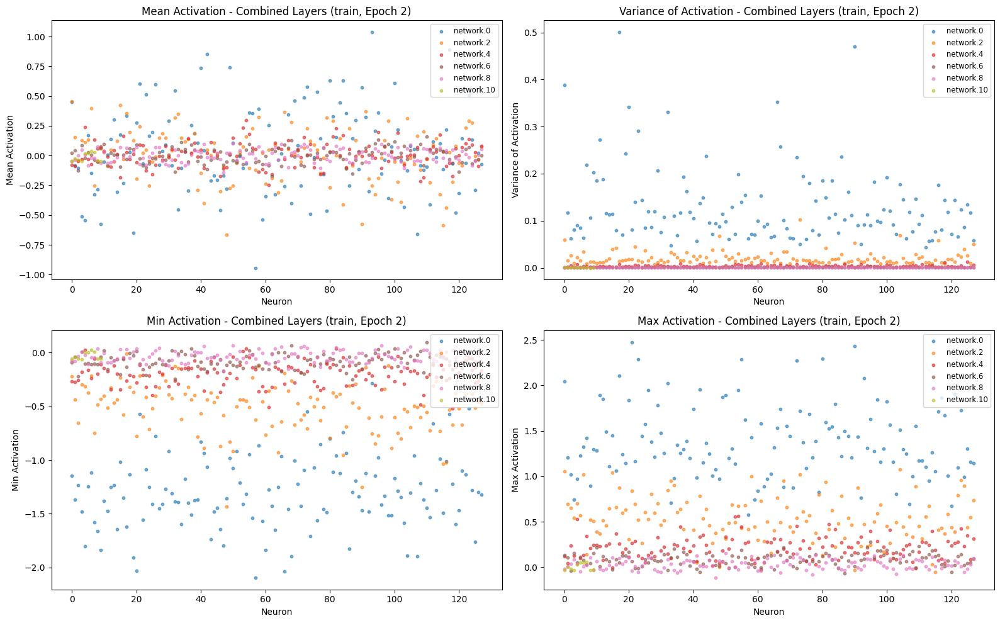

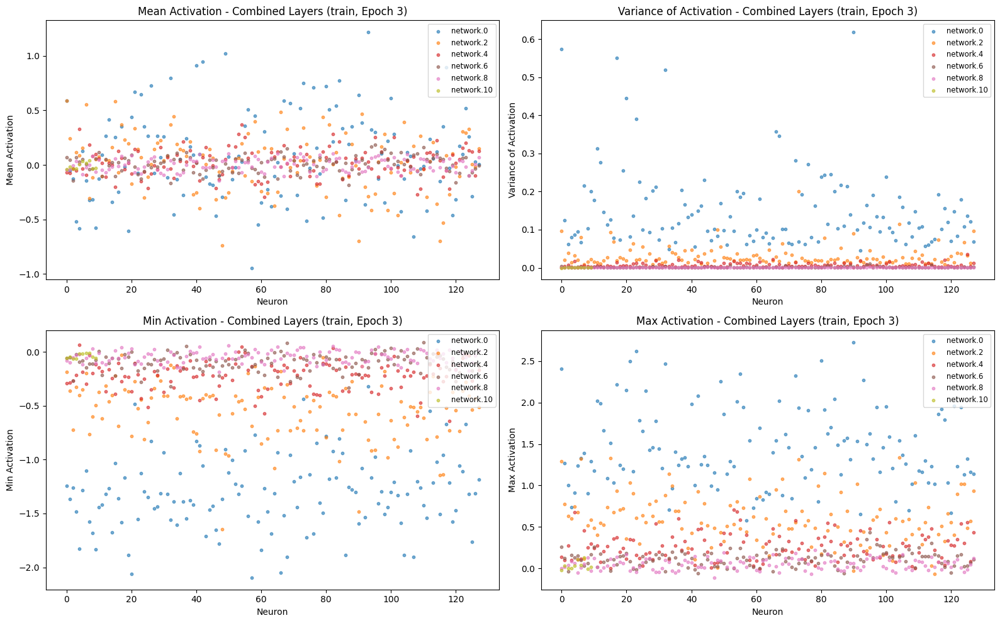

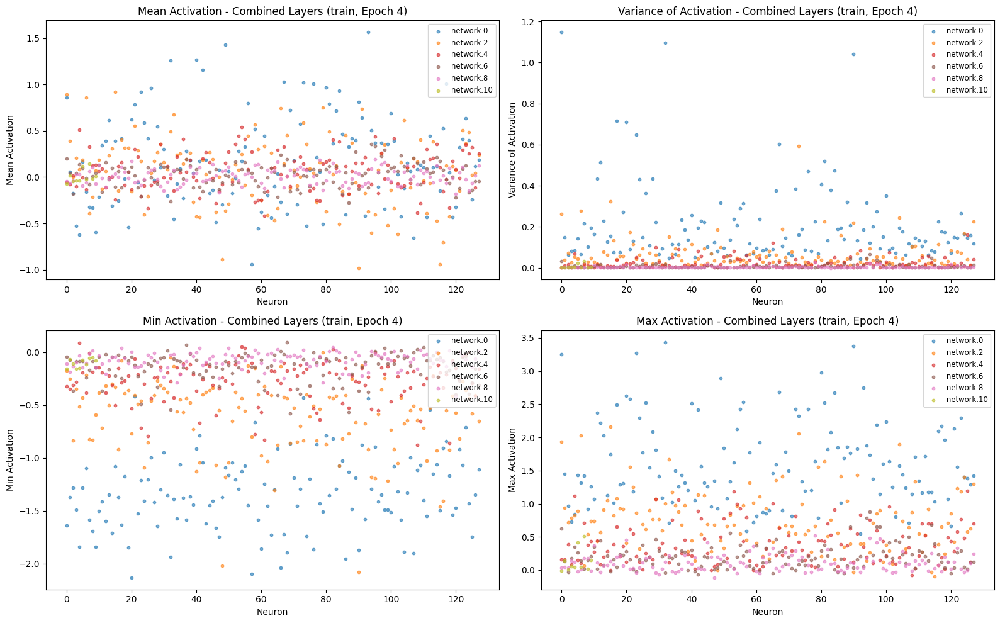

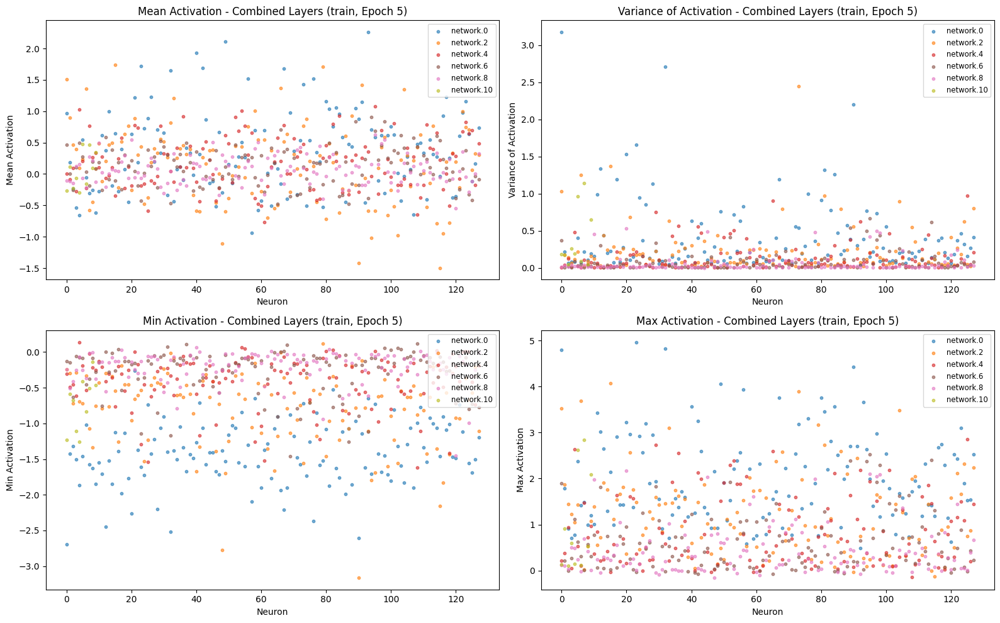

...

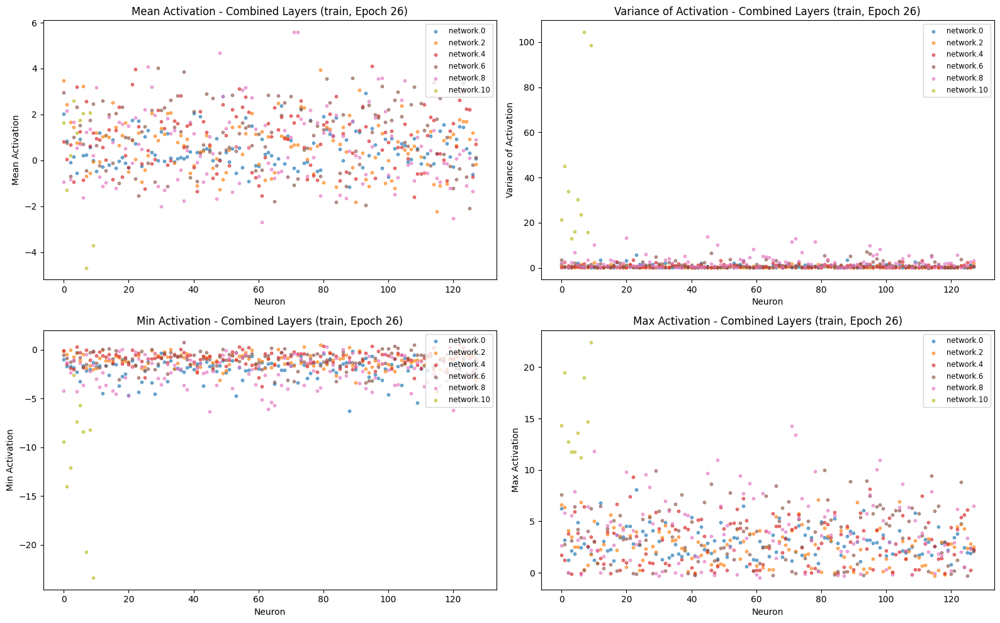

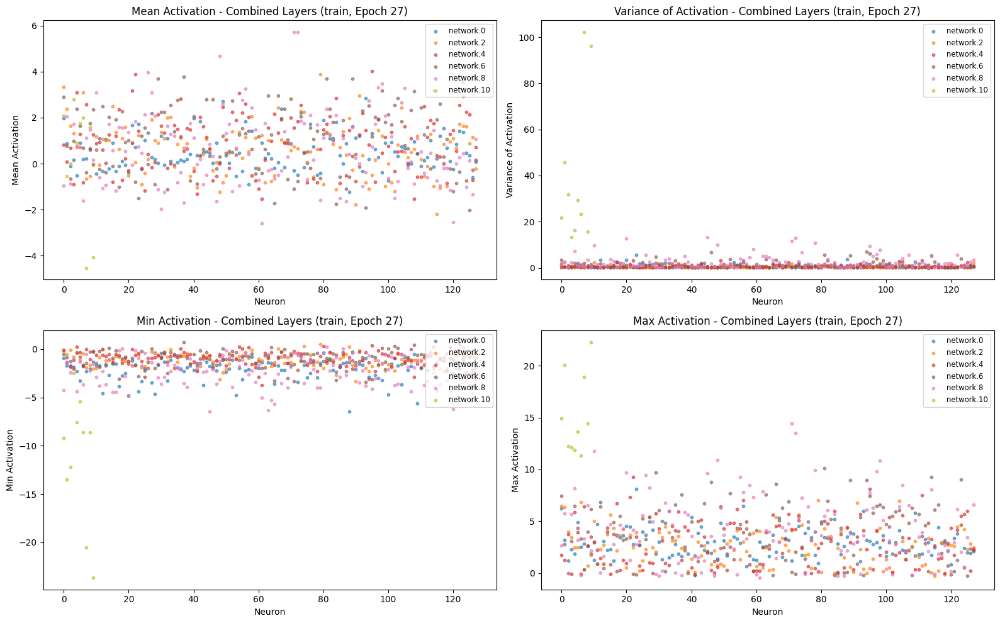

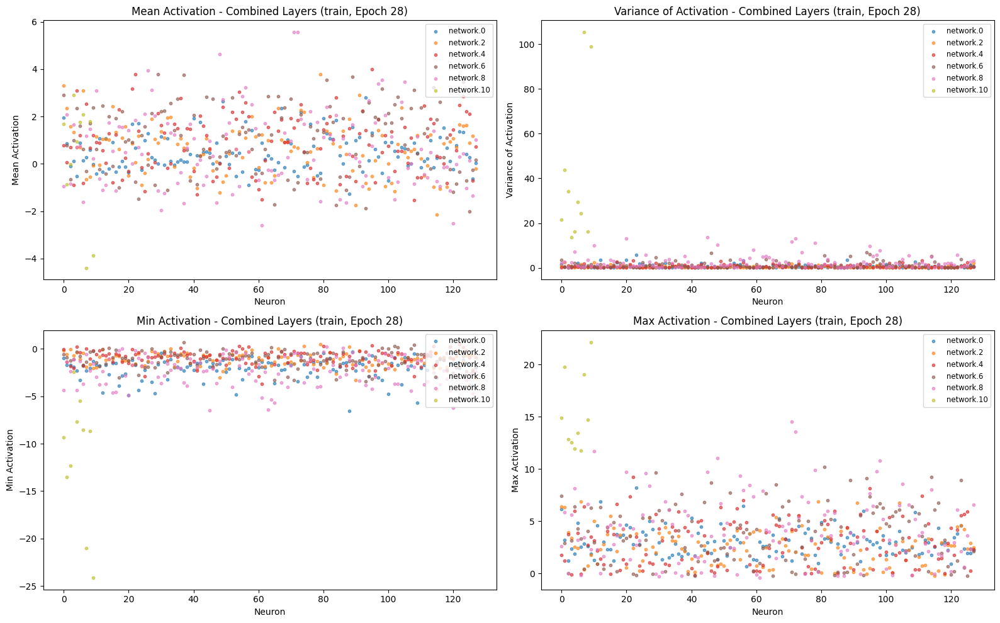

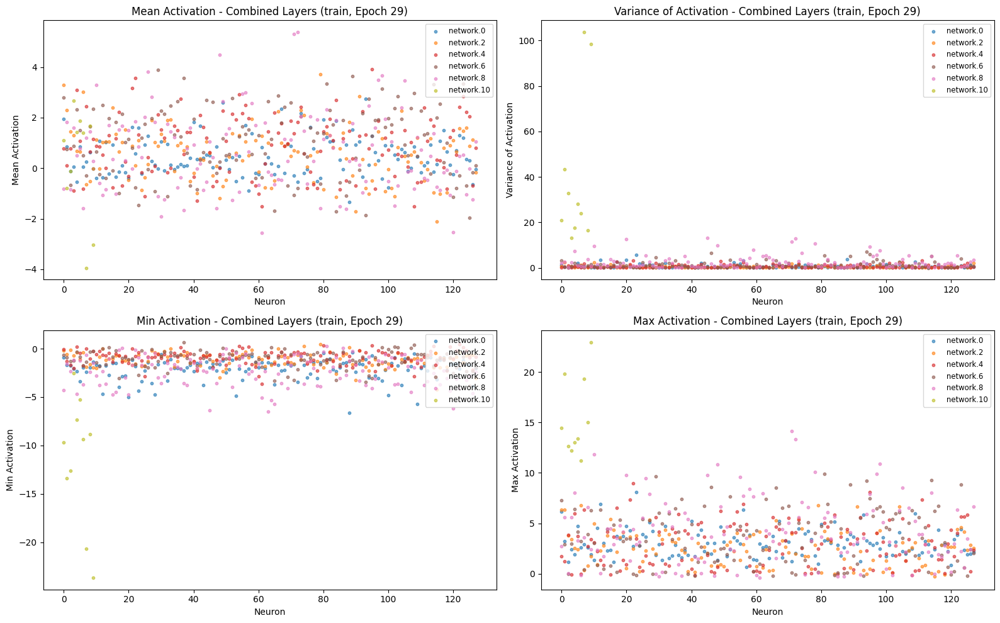

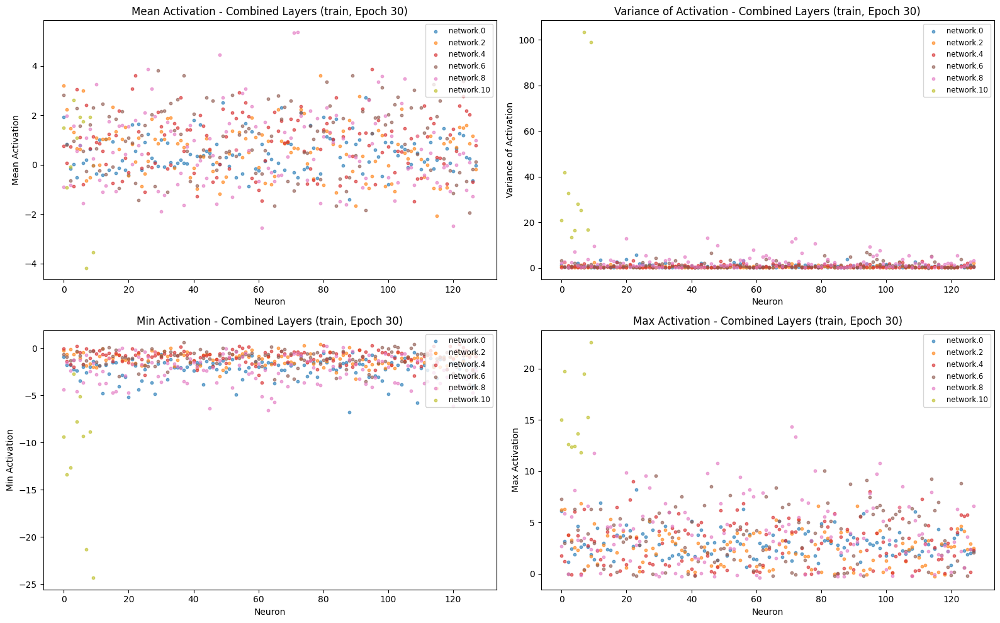


Displaying combined plots for Test Set over 10 epochs:


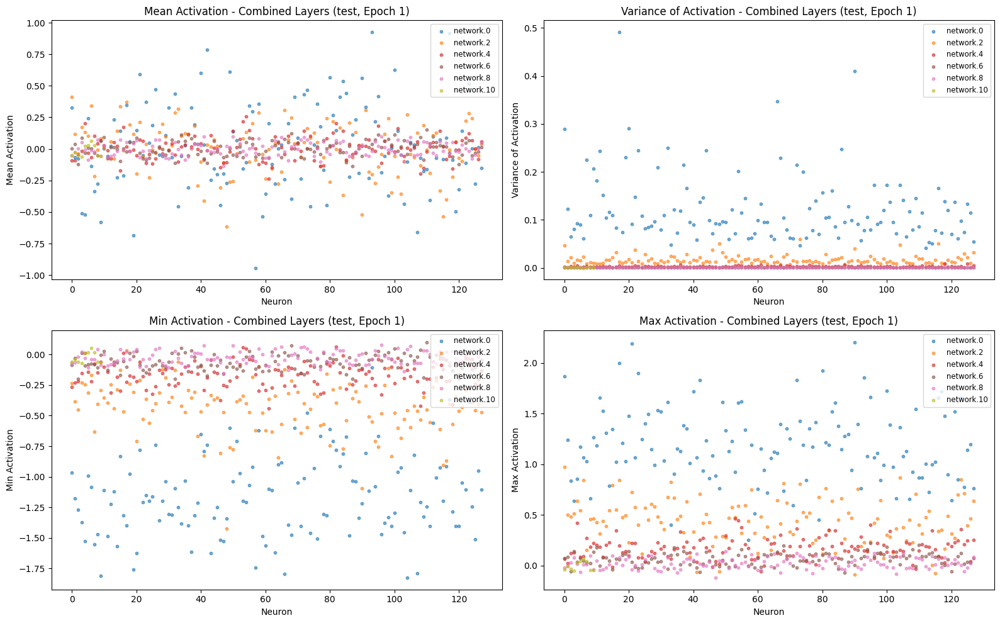

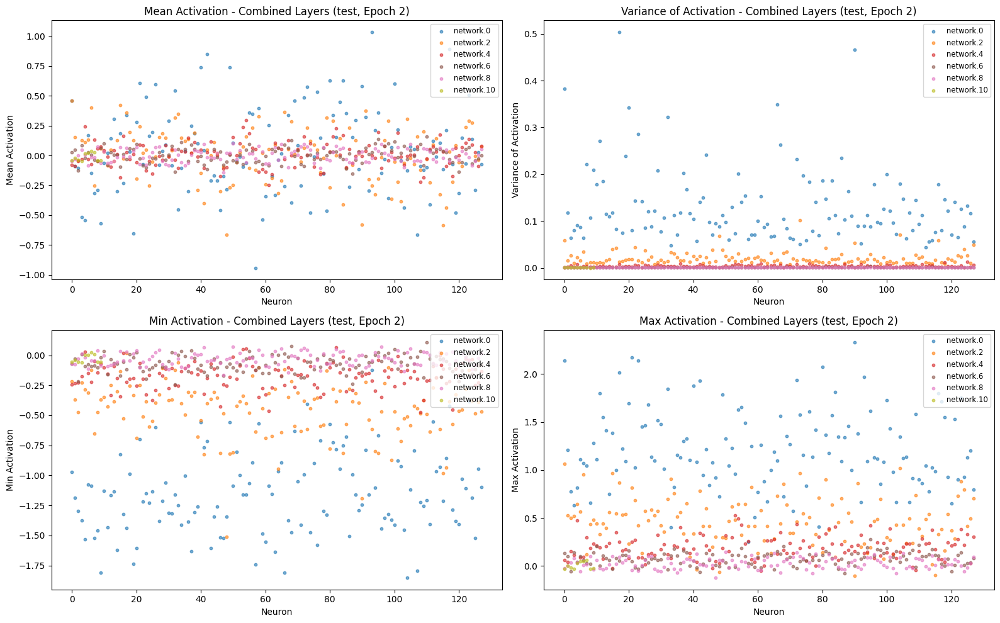

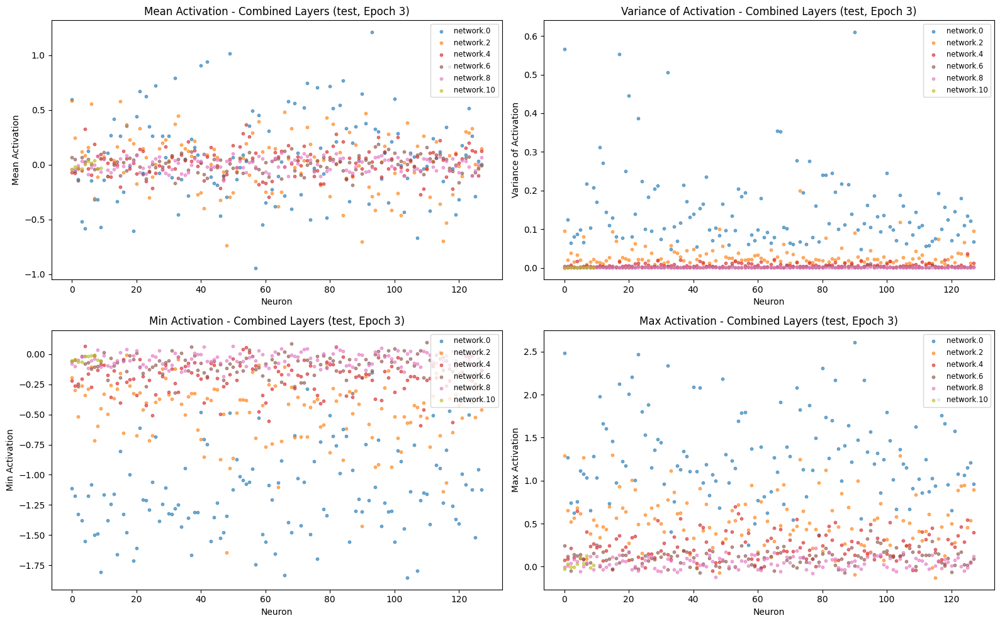

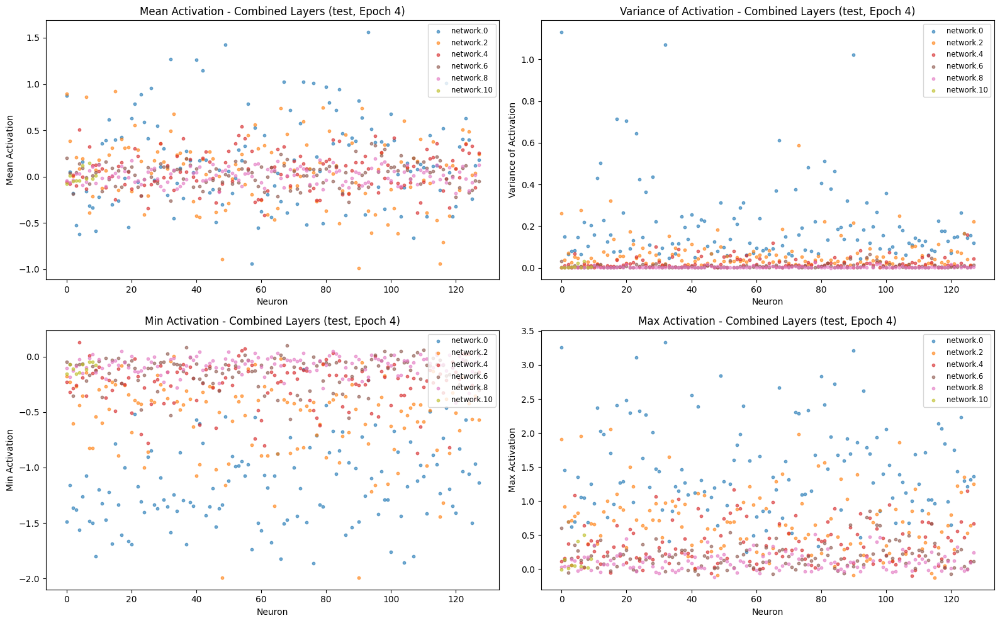

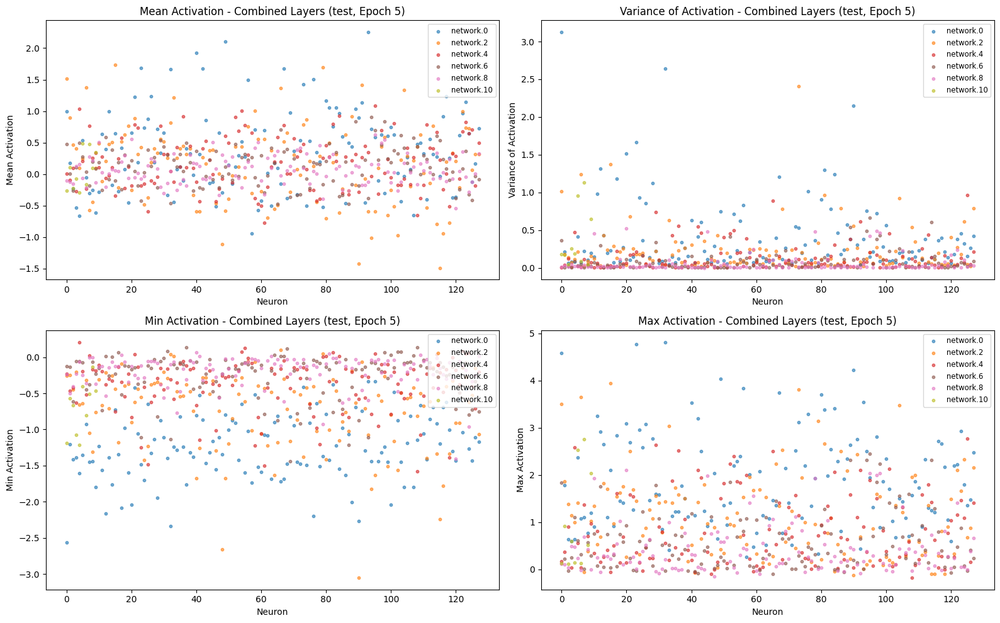

...

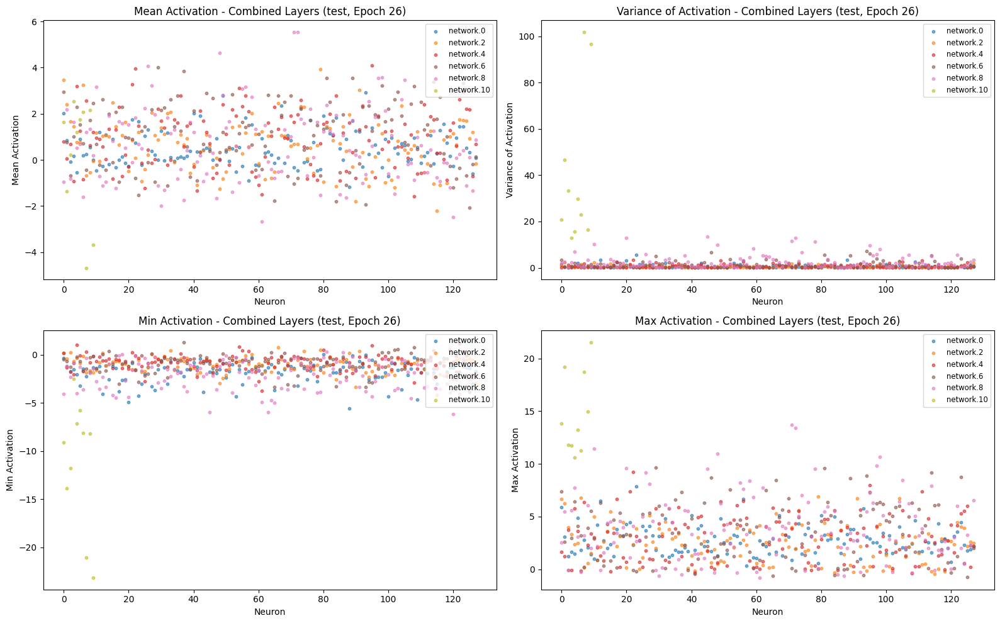

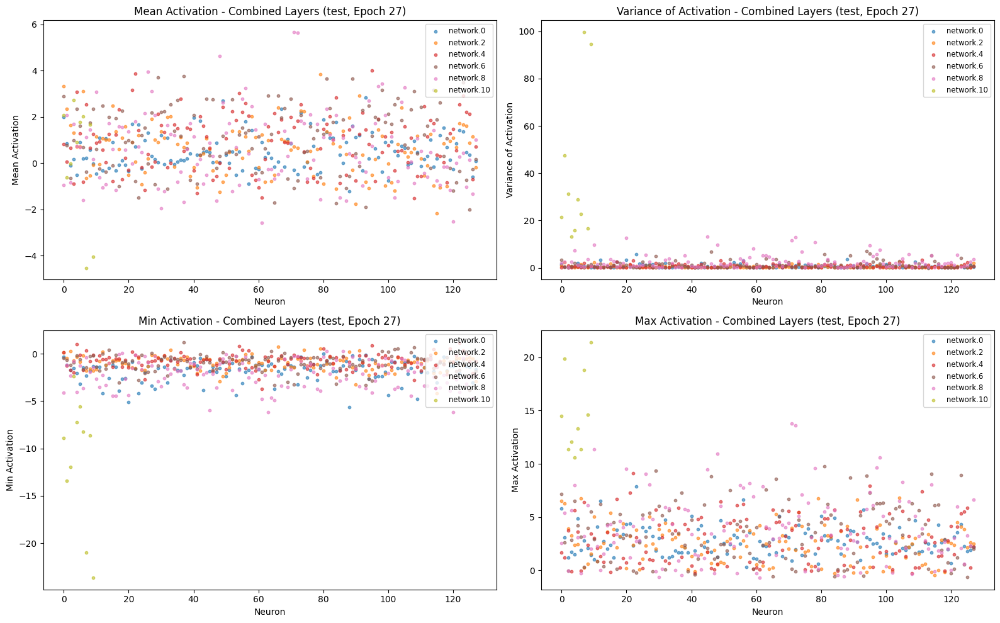

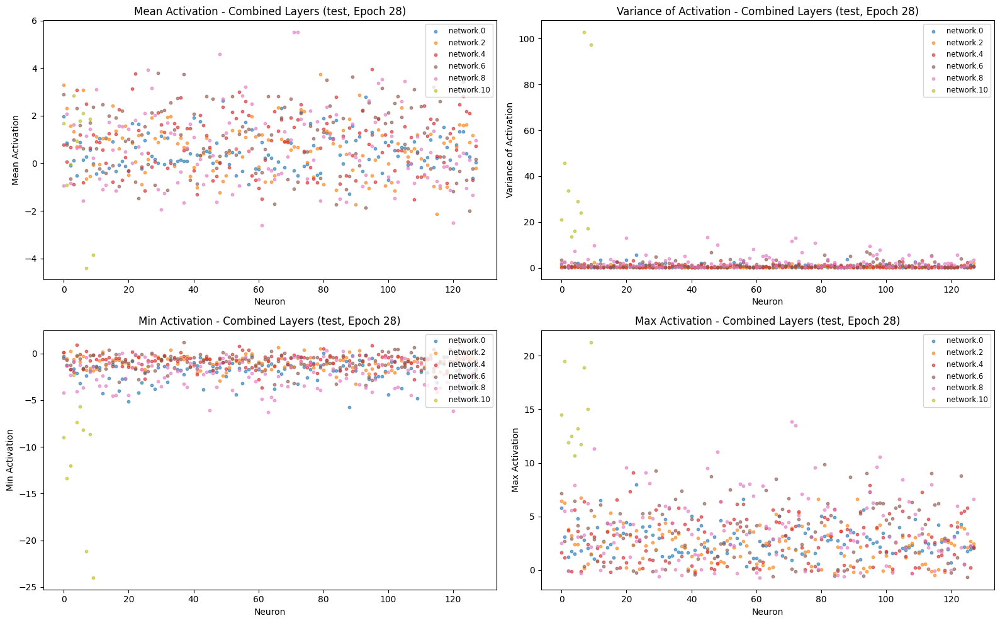

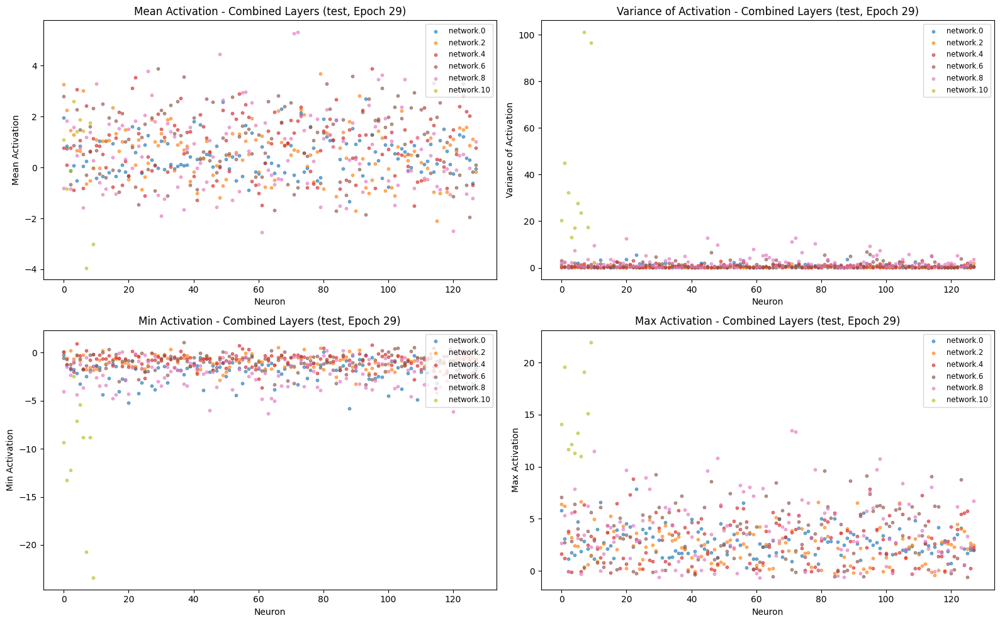

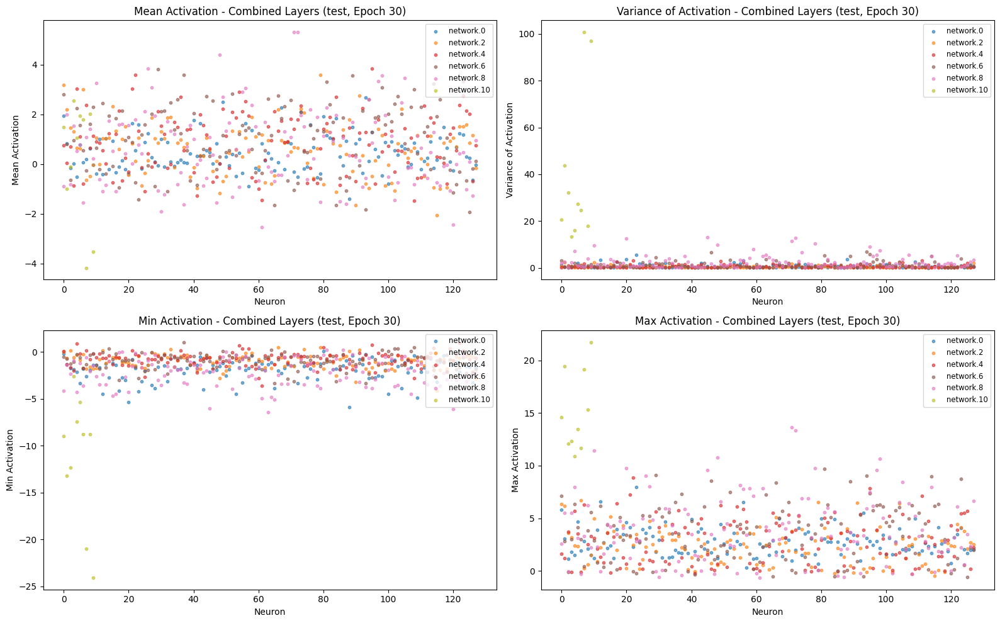

In [10]:
# Import matplotlib color maps for easier layer distinction
from matplotlib import cm
from matplotlib.colors import to_rgba

# Function to create combined plots for each epoch
def plot_combined_layers_over_epochs(all_stats, dataset_type):
    num_epochs = len(all_stats)
    layers = all_stats[0].keys()
    num_layers = len(layers)
    
    # Create a unique color for each layer using a color map
    colors = [cm.get_cmap('tab10')(i / num_layers) for i in range(num_layers)]
    
    for epoch in range(num_epochs):
        plt.figure(figsize=(16, 10))
        
        # Plot combined mean activations
        plt.subplot(2, 2, 1)
        for layer_idx, layer in enumerate(layers):
            num_neurons = len(all_stats[epoch][layer]['mean'])
            neurons = range(num_neurons)
            plt.scatter(neurons, all_stats[epoch][layer]['mean'], s=10, alpha=0.6, label=f'{layer}', color=colors[layer_idx])
        plt.title(f'Mean Activation - Combined Layers ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Mean Activation')
        plt.legend(loc='upper right', fontsize='small')

        # Plot combined variance of activations
        plt.subplot(2, 2, 2)
        for layer_idx, layer in enumerate(layers):
            num_neurons = len(all_stats[epoch][layer]['variance'])
            neurons = range(num_neurons)
            plt.scatter(neurons, all_stats[epoch][layer]['variance'], s=10, alpha=0.6, label=f'{layer}', color=colors[layer_idx])
        plt.title(f'Variance of Activation - Combined Layers ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Variance of Activation')
        plt.legend(loc='upper right', fontsize='small')

        # Plot combined min activations
        plt.subplot(2, 2, 3)
        for layer_idx, layer in enumerate(layers):
            num_neurons = len(all_stats[epoch][layer]['min'])
            neurons = range(num_neurons)
            plt.scatter(neurons, all_stats[epoch][layer]['min'], s=10, alpha=0.6, label=f'{layer}', color=colors[layer_idx])
        plt.title(f'Min Activation - Combined Layers ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Min Activation')
        plt.legend(loc='upper right', fontsize='small')

        # Plot combined max activations
        plt.subplot(2, 2, 4)
        for layer_idx, layer in enumerate(layers):
            num_neurons = len(all_stats[epoch][layer]['max'])
            neurons = range(num_neurons)
            plt.scatter(neurons, all_stats[epoch][layer]['max'], s=10, alpha=0.6, label=f'{layer}', color=colors[layer_idx])
        plt.title(f'Max Activation - Combined Layers ({dataset_type}, Epoch {epoch+1})')
        plt.xlabel('Neuron')
        plt.ylabel('Max Activation')
        plt.legend(loc='upper right', fontsize='small')
        
        # Display the plot for this epoch
        plt.tight_layout()
        plt.show()

# Create combined plots for both training and test sets
print("Displaying combined plots for Training Set over 10 epochs:")
plot_combined_layers_over_epochs(all_statistics_train, 'train')

print("\nDisplaying combined plots for Test Set over 10 epochs:")
plot_combined_layers_over_epochs(all_statistics_test, 'test')
